In [2]:
# !pip install -U --pre tensorflow_gpu=="2.2.0"

## IMPORT LIBRARIES

In [3]:
import tensorflow as tf
print("Tensor version" + tf.__version__)
print(tf.config.list_physical_devices('GPU'))

import pathlib
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
#from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

2023-10-21 00:42:56.178795: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-21 00:42:58.493653: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


Tensor version2.13.1
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [4]:
# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [5]:
# Change the current working directory to the models/research/ directory using the shell command
%cd models/research/

# Compile Protocol Buffers (protobuf) Files & specifying the output directory
!protoc object_detection/protos/*.proto --python_out=.

# Copy the setup.py File to the current working directory
!cp object_detection/packages/tf2/setup.py .

# Install the Object Detection API as a Python Package
!python -m pip install .


/home/759635/models/research
Defaulting to user installation because normal site-packages is not writeable
Processing /home/759635/models/research
  Preparing metadata (setup.py) ... done


  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1655482 sha256=a43118f9b8aa492b82e1f49abdf81524acf12c2018f64bbfbdab054611014501
  Stored in directory: /tmp/pip-ephem-wheel-cache-mipqv45_/wheels/62/a8/86/9373ca9ebb24c3dc38d6010c2221ff7c231b243aadf64044f2
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [6]:
#run model builder test
!python /home/759635/models/research/object_detection/builders/model_builder_tf2_test.py

2023-10-21 00:43:34.095313: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-21 00:43:36.014600: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Running tests under Python 3.10.10: /home/ViperAppsFiles/python/anaconda/miniconda/3.10/bin/python
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-10-21 00:43:41.535500: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43355 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
W1021 00:43:41.981806 140394141161280 batch_normalization.py:1531] `tf.keras.layers.experimental.SyncBatchNormalization` endpoint is deprecated and wil

I1021 00:43:48.660462 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b0
I1021 00:43:48.660549 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 64
I1021 00:43:48.660607 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:164] EfficientDet BiFPN num iterations: 3
I1021 00:43:48.663035 140394141161280 efficientnet_model.py:143] round_filter input=32 output=32
I1021 00:43:48.690412 140394141161280 efficientnet_model.py:143] round_filter input=32 output=32
I1021 00:43:48.690493 140394141161280 efficientnet_model.py:143] round_filter input=16 output=16
I1021 00:43:48.767237 140394141161280 efficientnet_model.py:143] round_filter input=16 output=16
I1021 00:43:48.767320 140394141161280 efficientnet_model.py:143] round_filter input=24 output=24
I1021 00:43:48.965016 140394141161280 efficientnet_model.py:143] round_filter input=24 output=24
I1021 00:43:48.965099 140

I1021 00:43:52.474751 140394141161280 efficientnet_model.py:143] round_filter input=16 output=16
I1021 00:43:52.474832 140394141161280 efficientnet_model.py:143] round_filter input=24 output=24
I1021 00:43:52.936411 140394141161280 efficientnet_model.py:143] round_filter input=24 output=24
I1021 00:43:52.936559 140394141161280 efficientnet_model.py:143] round_filter input=40 output=48
I1021 00:43:53.198896 140394141161280 efficientnet_model.py:143] round_filter input=40 output=48
I1021 00:43:53.198980 140394141161280 efficientnet_model.py:143] round_filter input=80 output=88
I1021 00:43:53.550608 140394141161280 efficientnet_model.py:143] round_filter input=80 output=88
I1021 00:43:53.550692 140394141161280 efficientnet_model.py:143] round_filter input=112 output=120
I1021 00:43:53.903030 140394141161280 efficientnet_model.py:143] round_filter input=112 output=120
I1021 00:43:53.903112 140394141161280 efficientnet_model.py:143] round_filter input=192 output=208
I1021 00:43:54.335353 14

I1021 00:43:58.838966 140394141161280 efficientnet_model.py:143] round_filter input=112 output=160
I1021 00:43:58.839050 140394141161280 efficientnet_model.py:143] round_filter input=192 output=272
I1021 00:43:59.768285 140394141161280 efficientnet_model.py:143] round_filter input=192 output=272
I1021 00:43:59.768431 140394141161280 efficientnet_model.py:143] round_filter input=320 output=448
I1021 00:43:59.948877 140394141161280 efficientnet_model.py:143] round_filter input=1280 output=1792
I1021 00:43:59.985325 140394141161280 efficientnet_model.py:453] Building model efficientnet with params ModelConfig(width_coefficient=1.4, depth_coefficient=1.8, resolution=380, dropout_rate=0.4, blocks=(BlockConfig(input_filters=32, output_filters=16, kernel_size=3, num_repeat=1, expand_ratio=1, strides=(1, 1), se_ratio=0.25, id_skip=True, fused_conv=False, conv_type='depthwise'), BlockConfig(input_filters=16, output_filters=24, kernel_size=3, num_repeat=2, expand_ratio=6, strides=(2, 2), se_rati

I1021 00:44:07.744024 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b7
I1021 00:44:07.744105 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 384
I1021 00:44:07.744159 140394141161280 ssd_efficientnet_bifpn_feature_extractor.py:164] EfficientDet BiFPN num iterations: 8
I1021 00:44:07.745892 140394141161280 efficientnet_model.py:143] round_filter input=32 output=64
I1021 00:44:07.764306 140394141161280 efficientnet_model.py:143] round_filter input=32 output=64
I1021 00:44:07.764381 140394141161280 efficientnet_model.py:143] round_filter input=16 output=32
I1021 00:44:08.041455 140394141161280 efficientnet_model.py:143] round_filter input=16 output=32
I1021 00:44:08.041537 140394141161280 efficientnet_model.py:143] round_filter input=24 output=48
I1021 00:44:08.630158 140394141161280 efficientnet_model.py:143] round_filter input=24 output=48
I1021 00:44:08.630240 14

In [7]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

In [8]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Uz0dK7R91xLNuBbVlwCj")
project = rf.workspace("happiness").project("endo")
dataset = project.version(1).download("tfrecord")


Defaulting to user installation because normal site-packages is not writeable
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Endo-1 in tfrecord:: 100%|██████████| 11/11 [00:00<00:00, 148.73it/s]


In [9]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
test_record_fname = dataset.location + '/test/endometriosis.tfrecord'
train_record_fname = dataset.location + '/train/endometriosis.tfrecord'
label_map_pbtxt_fname = dataset.location + '/train/endometriosis_label_map.pbtxt'

In [10]:
dataset.location

'/home/759635/models/research/Endo-1'

In [11]:
# dataset.location = '/home/759635/Endo-1'

In [12]:
##change chosen model to deploy different models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 16
    }
}

#in this tutorial we implement the lightweight, smallest state of the art efficientdet model
#if you want to scale up tot larger efficientdet models you will likely need more compute!
chosen_model = 'efficientdet-d0'

num_steps = 40000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing.
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] #if you can fit a large batch in memory, it may speed up your training

In [13]:
#download pretrained weights
%mkdir /home/759635/models/research/deploy/
%cd /home/759635/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

mkdir: cannot create directory ‘/home/759635/models/research/deploy/’: File exists
/home/759635/models/research/deploy
--2023-10-21 00:44:28--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 216.58.201.123, 172.217.169.27, 142.250.200.59, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|216.58.201.123|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz.1’

100%[======================================>] 30,736,482  24.1MB/s   in 1.2s   

2023-10-21 00:44:29 (24.1 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz.1’ saved [30736482/30736482]



In [14]:
#download base training configuration file
%cd /home/759635/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/home/759635/models/research/deploy
--2023-10-21 00:44:30--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.1’

100%[======================================>] 4,630       --.-K/s   in 0s      

2023-10-21 00:44:30 (21.9 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.1’ saved [4630/4630]



In [15]:
#prepare
pipeline_fname = '/home/759635/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/home/759635/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)


In [16]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /home/759635/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    f.write(s)



/home/759635/models/research/deploy
writing custom configuration file


In [17]:
%cat /home/759635/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 4
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [18]:
pipeline_file = '/home/759635/models/research/deploy/pipeline_file.config'
model_dir = '/home/759635/training/'

# Train Custom TF2 Object Detector

* pipeline_file: defined above in writing custom training configuration
* model_dir: the location tensorboard logs and saved model checkpoints will save to
* num_train_steps: how long to train for
* num_eval_steps: perform eval on validation set after this many steps







In [19]:
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-10-21 00:44:32.617360: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-21 00:44:34.551945: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-10-21 00:44:40.693987: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43355 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I1021 00:44:40.700255 140321239975744 mirrored_strategy.py:419] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 40000
I1021 00:

Instructions for updating:
rename to distribute_datasets_from_function
W1021 00:44:43.569556 140321239975744 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/object_detection/model_lib_v2.py:563: StrategyBase.experimental_distribute_datasets_from_function (from tensorflow.python.distribute.distribute_lib) is deprecated and will be removed in a future version.
Instructions for updating:
rename to distribute_datasets_from_function
INFO:tensorflow:Reading unweighted datasets: ['/home/759635/models/research/Endo-1/train/endometriosis.tfrecord']
I1021 00:44:43.679351 140321239975744 dataset_builder.py:162] Reading unweighted datasets: ['/home/759635/models/research/Endo-1/train/endometriosis.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['/home/759635/models/research/Endo-1/train/endometriosis.tfrecord']
I1021 00:44:43.679581 140321239975744 dataset_builder.py:79] Reading record datasets for input file: ['/home/759635/models/research/Endo-1/trai

In [20]:
#run model evaluation to obtain performance metrics
!python /home/759635/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --checkpoint_dir={model_dir} \
#Not yet implemented for EfficientDet

2023-10-21 00:45:36.935459: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-21 00:45:39.529207: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
W1021 00:45:45.149319 140688729487168 model_lib_v2.py:1089] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I1021 00:45:45.149593 140688729487168 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I1021 00:45:45.149656 140688729487168 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I1021 00:45:45.149738 140688729487168 config_util.py:552] Maybe o

Instructions for updating:
Use `tf.cast` instead.
W1021 00:45:53.182345 140688729487168 deprecation.py:364] From /home/759635/.local/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1176: to_float (from tensorflow.python.ops.math_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use `tf.cast` instead.
INFO:tensorflow:Waiting for new checkpoint at /home/759635/training/
I1021 00:45:55.498974 140688729487168 checkpoint_utils.py:168] Waiting for new checkpoint at /home/759635/training/
INFO:tensorflow:Found new checkpoint at /home/759635/training/ckpt-41
I1021 00:45:55.500760 140688729487168 checkpoint_utils.py:177] Found new checkpoint at /home/759635/training/ckpt-41
/home/759635/.local/lib/python3.10/site-packages/keras/src/backend.py:452: UserWarning: `tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` metho

INFO:tensorflow:Exiting evaluation at step 40000
I1021 00:47:18.741497 140688729487168 model_lib_v2.py:1168] Exiting evaluation at step 40000


In [21]:
%load_ext tensorboard
%tensorboard --logdir '/home/759635/training/train'

## Exporting a Trained Inference Graph
Still to come for TF2 models

In [22]:
#see where our model saved weights
%ls '/home/759635/training/'

checkpoint                   ckpt-39.data-00000-of-00001
ckpt-35.data-00000-of-00001  ckpt-39.index
ckpt-35.index                ckpt-40.data-00000-of-00001
ckpt-36.data-00000-of-00001  ckpt-40.index
ckpt-36.index                ckpt-41.data-00000-of-00001
ckpt-37.data-00000-of-00001  ckpt-41.index
ckpt-37.index                eval/
ckpt-38.data-00000-of-00001  train/
ckpt-38.index


In [23]:
output_directory = '/home/759635/fine_tuned_model'

#place the model weights you would like to export here
last_model_path = '/home/759635/training/'
print(last_model_path)
!python /home/759635/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/home/759635/training/
2023-10-21 00:47:37.683114: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-21 00:47:39.506384: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-10-21 00:47:44.763902: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43355 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6
I1021 00:47:45.205401 140167723460416 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b0
I1021 00:47:45.205653 140167723460416 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 64
I1021 00:47:45.205722 

In [24]:
%ls '/home/759635/fine_tuned_model/saved_model/'

assets/  fingerprint.pb  saved_model.pb  variables/


# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [25]:
#downloading test images from Roboflow
#export dataset above with format COCO JSON
#or import your test images via other means.
%mkdir /home/759635/test/
%cd /home/759635/test/
#!curl -L "Uz0dK7R91xLNuBbVlwCj" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Uz0dK7R91xLNuBbVlwCj")
project = rf.workspace("happiness").project("endo")
dataset = project.version(1).download("coco")


mkdir: cannot create directory ‘/home/759635/test/’: File exists
/home/759635/test
Defaulting to user installation because normal site-packages is not writeable
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Endo-1 in coco:: 100%|██████████| 380/380 [00:00<00:00, 442.12it/s]


In [26]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [27]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [28]:
%ls '/home/759635/training/'

checkpoint                   ckpt-39.data-00000-of-00001
ckpt-35.data-00000-of-00001  ckpt-39.index
ckpt-35.index                ckpt-40.data-00000-of-00001
ckpt-36.data-00000-of-00001  ckpt-40.index
ckpt-36.index                ckpt-41.data-00000-of-00001
ckpt-37.data-00000-of-00001  ckpt-41.index
ckpt-37.index                eval/
ckpt-38.data-00000-of-00001  train/
ckpt-38.index


In [29]:
filenames = list(pathlib.Path('/home/759635/training/').glob('*.index'))

filenames.sort()
print(filenames)

#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/home/759635/training/ckpt-35.index'), PosixPath('/home/759635/training/ckpt-36.index'), PosixPath('/home/759635/training/ckpt-37.index'), PosixPath('/home/759635/training/ckpt-38.index'), PosixPath('/home/759635/training/ckpt-39.index'), PosixPath('/home/759635/training/ckpt-40.index'), PosixPath('/home/759635/training/ckpt-41.index')]


2023-10-21 00:49:09.876435: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43355 MB memory:  -> device: 0, name: NVIDIA A40, pci bus id: 0000:02:00.0, compute capability: 8.6


In [30]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

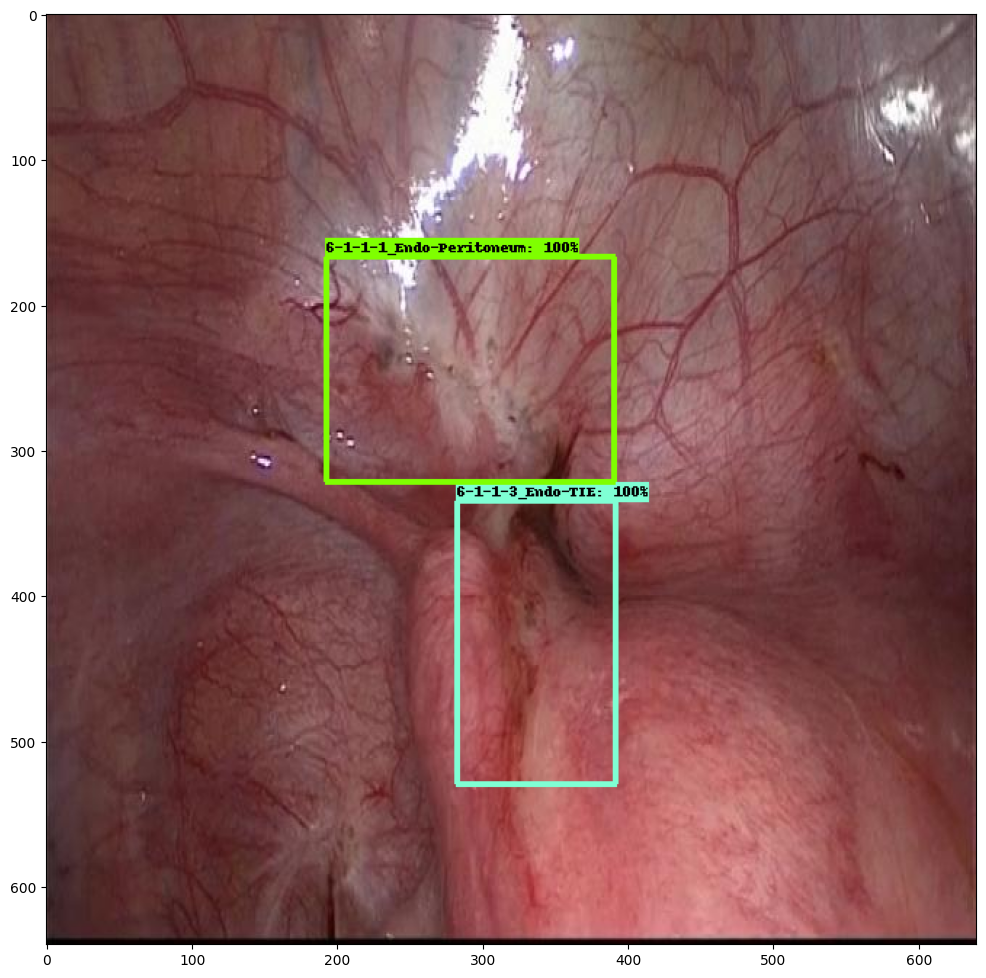

In [33]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

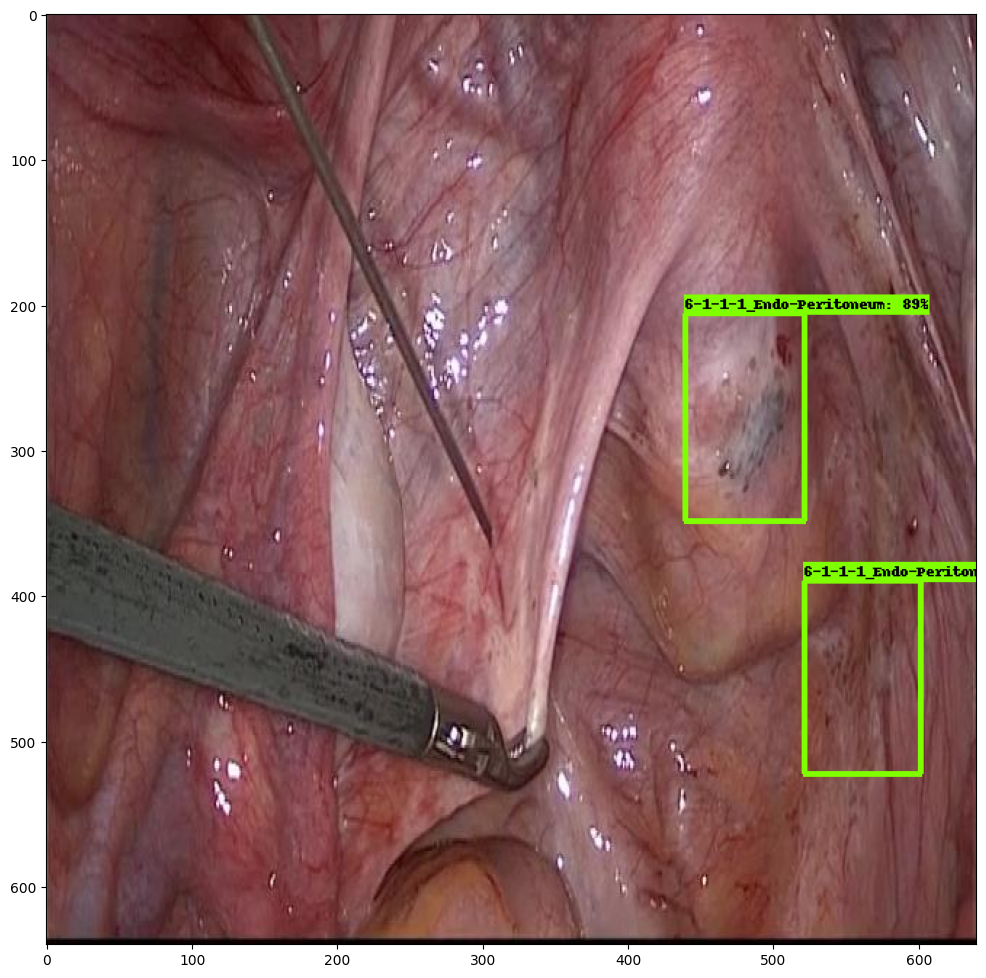

In [38]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

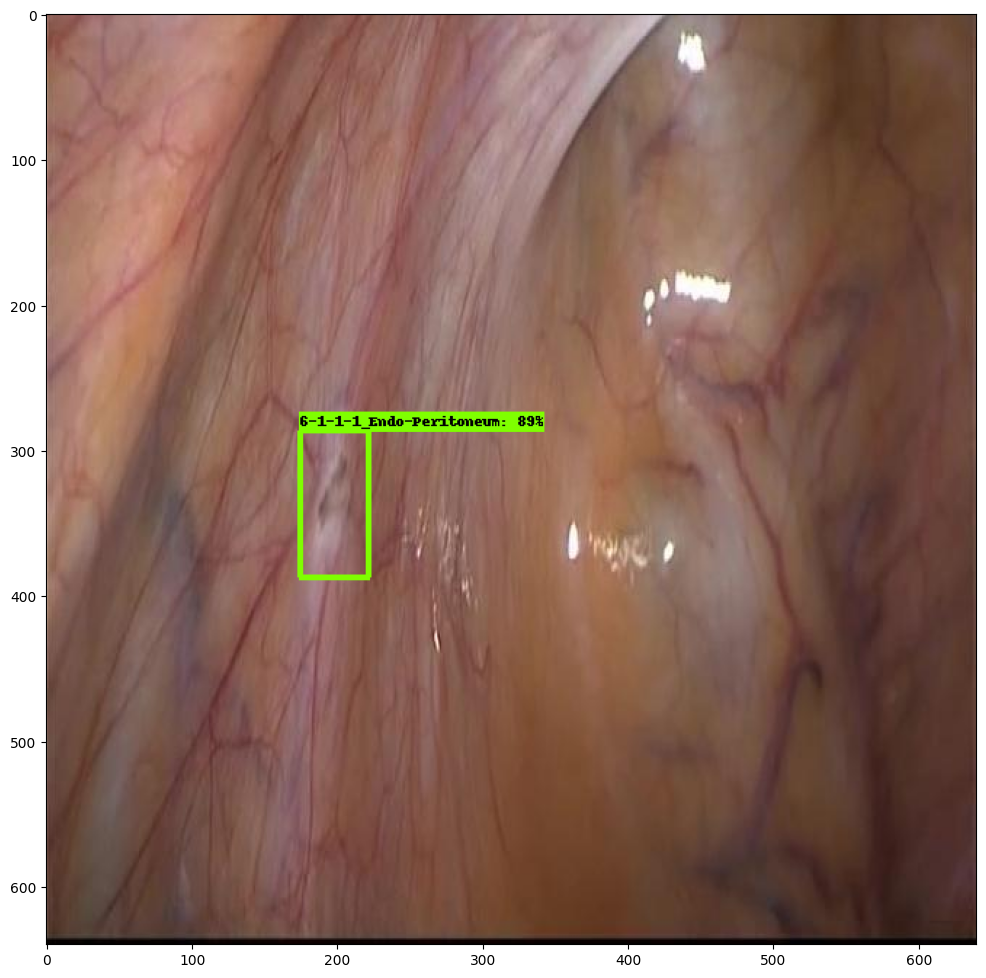

In [41]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,18))
plt.imshow(image_np_with_detections)
plt.show()

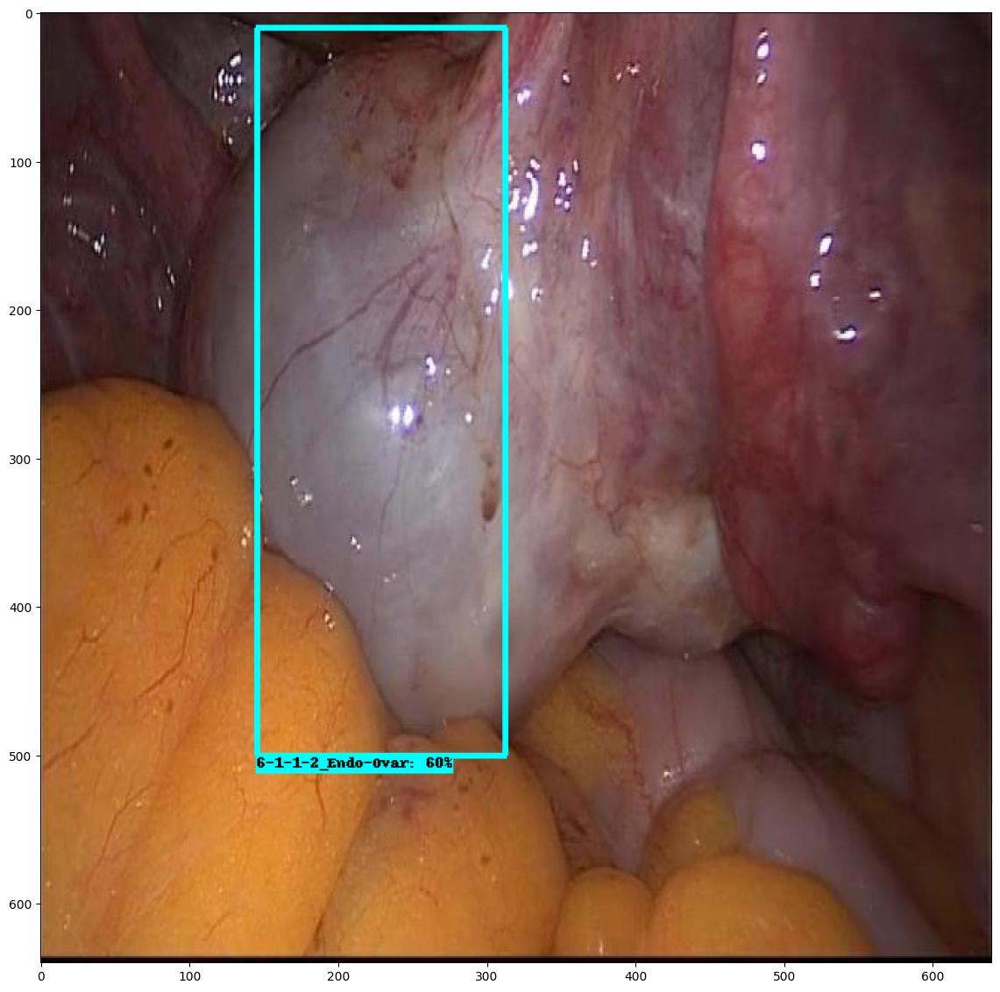

In [44]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(14,16))
plt.imshow(image_np_with_detections)
plt.show()

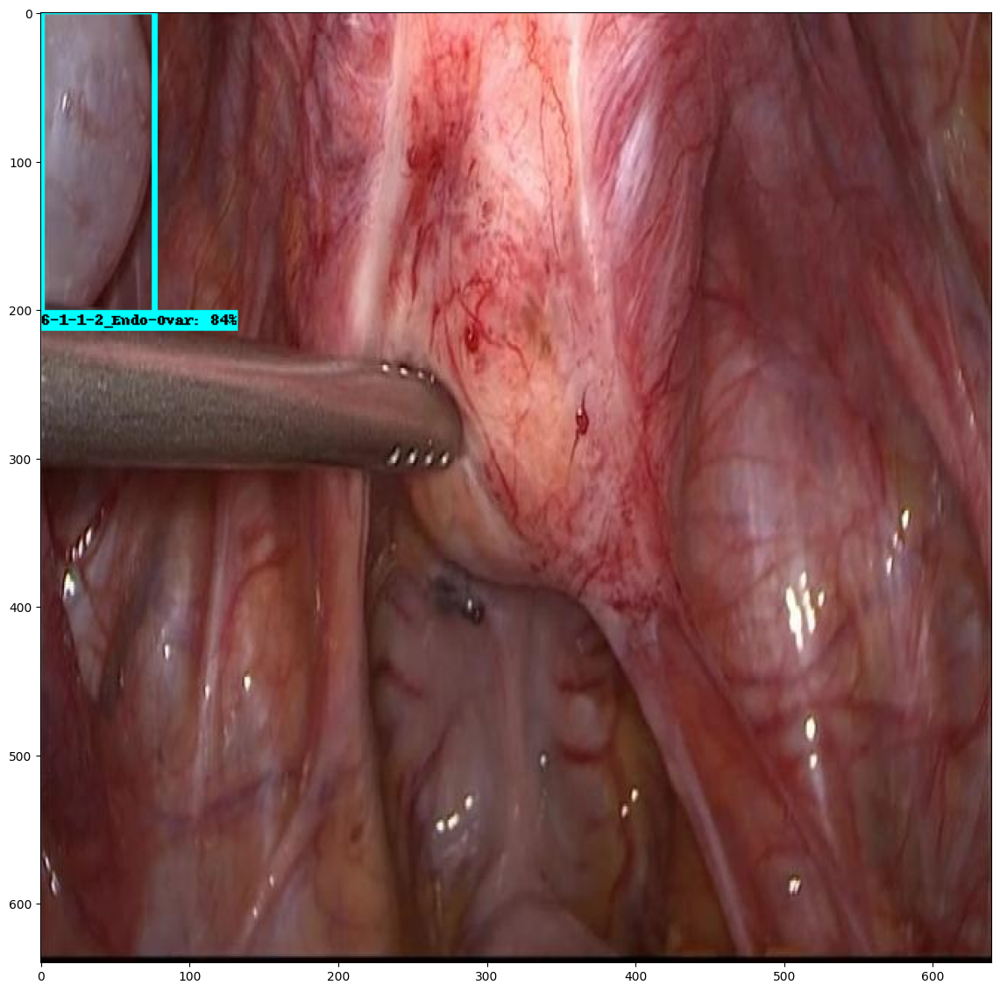

In [50]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(14,16))
plt.imshow(image_np_with_detections)
plt.show()

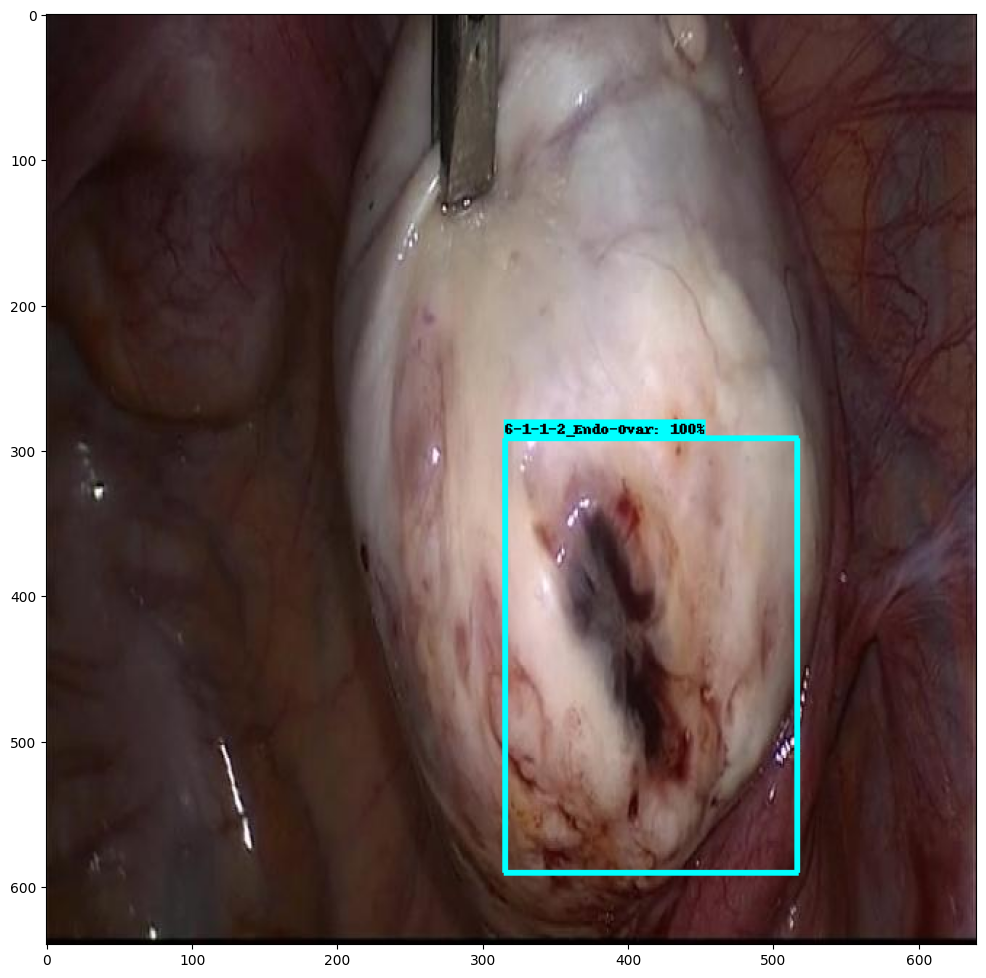

In [51]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

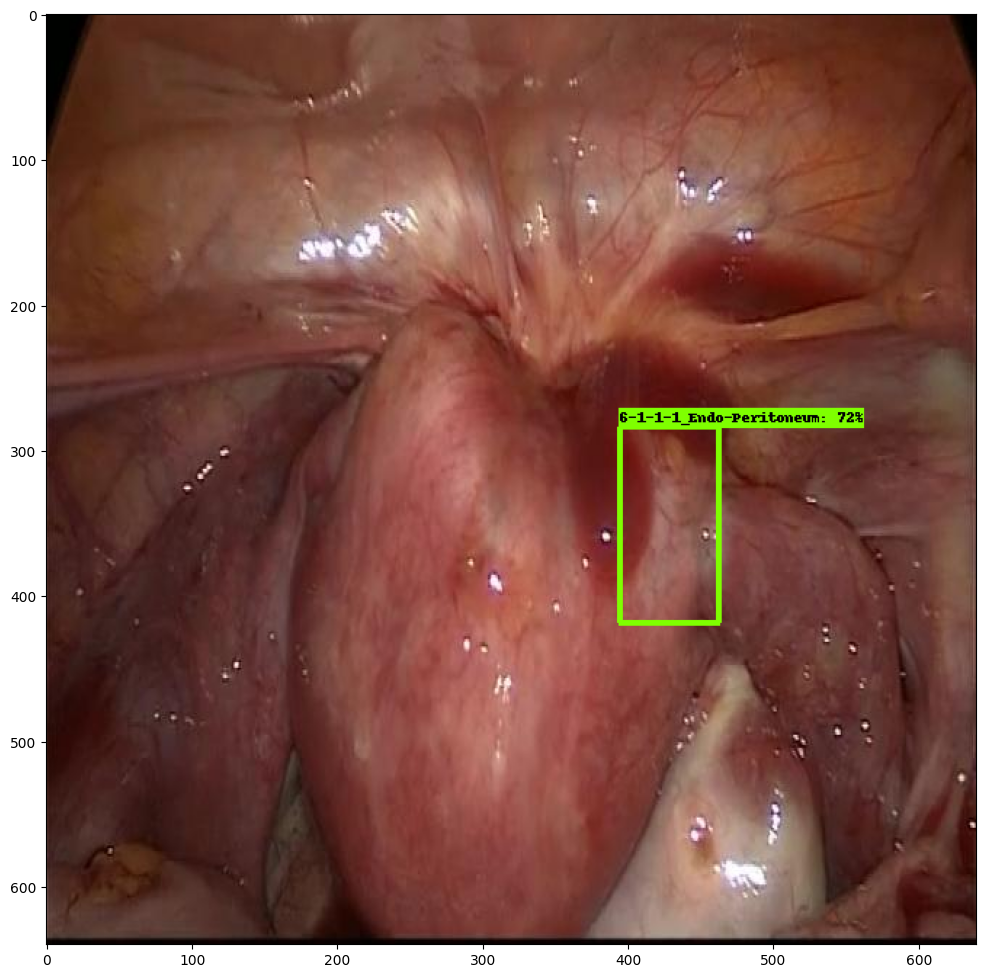

In [59]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

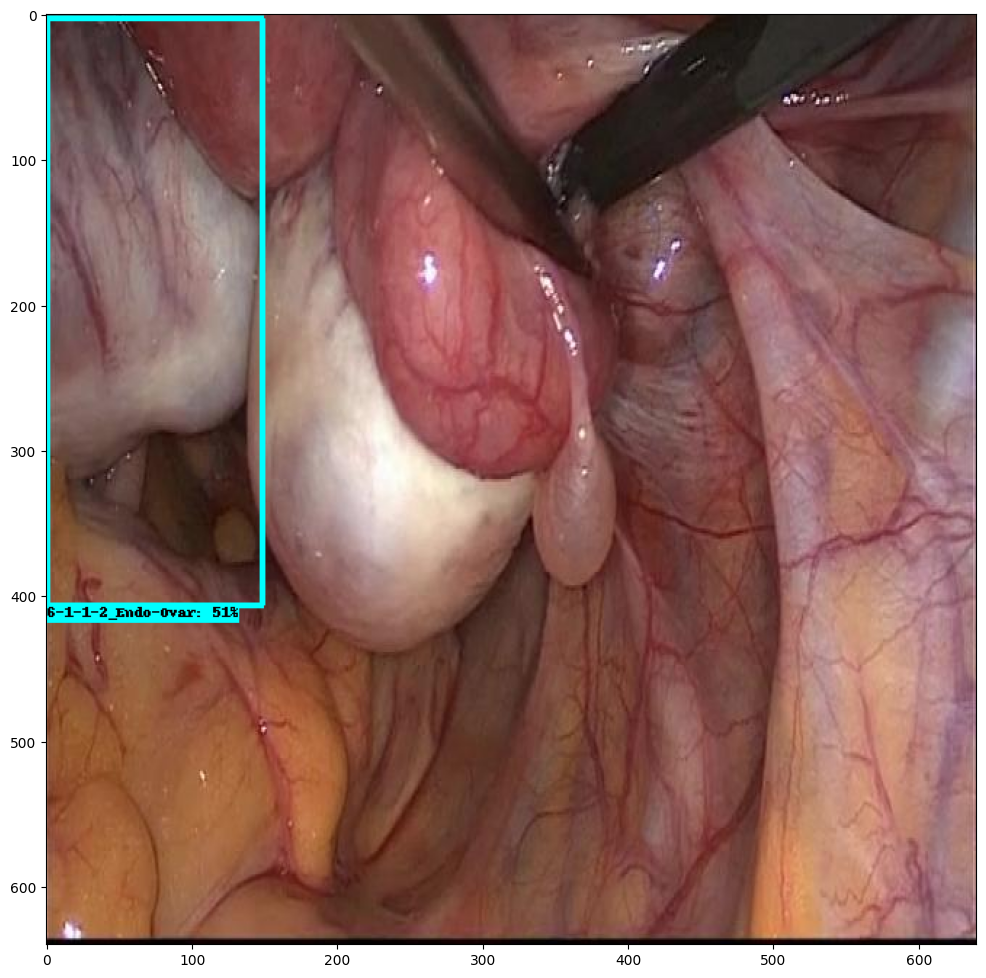

In [62]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

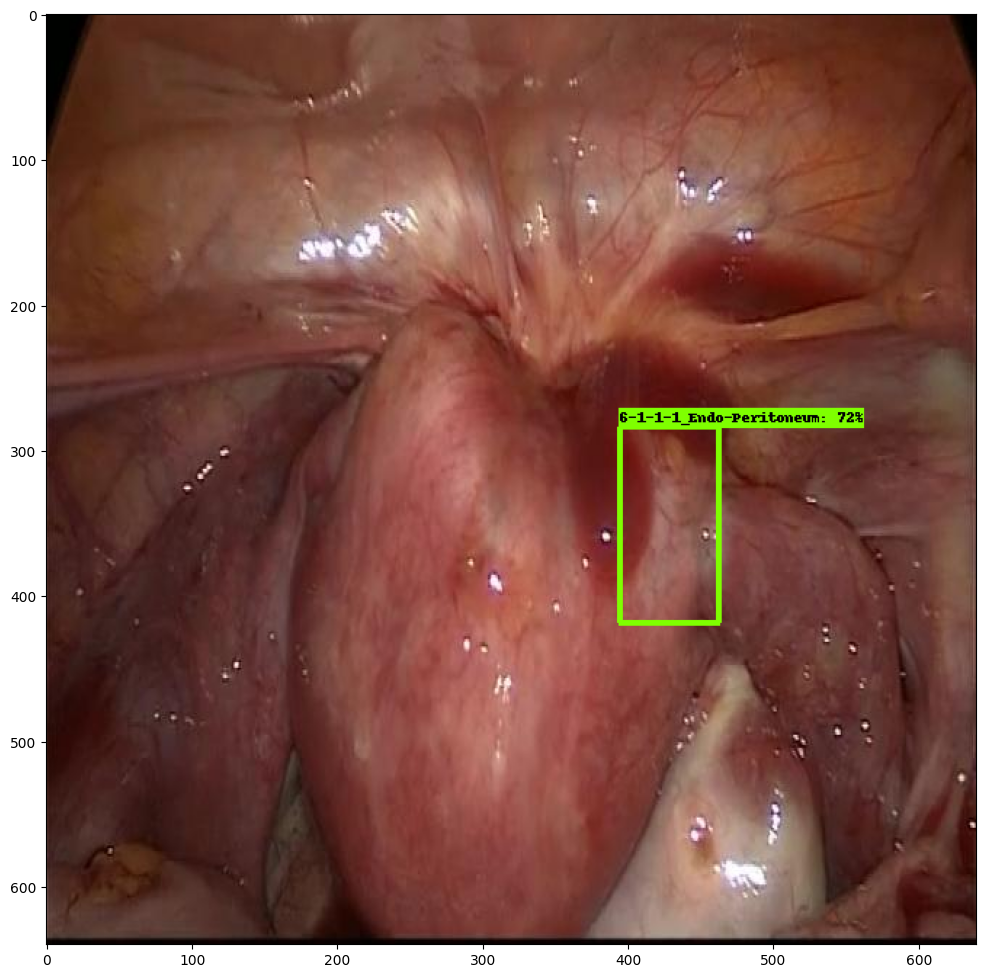

In [63]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

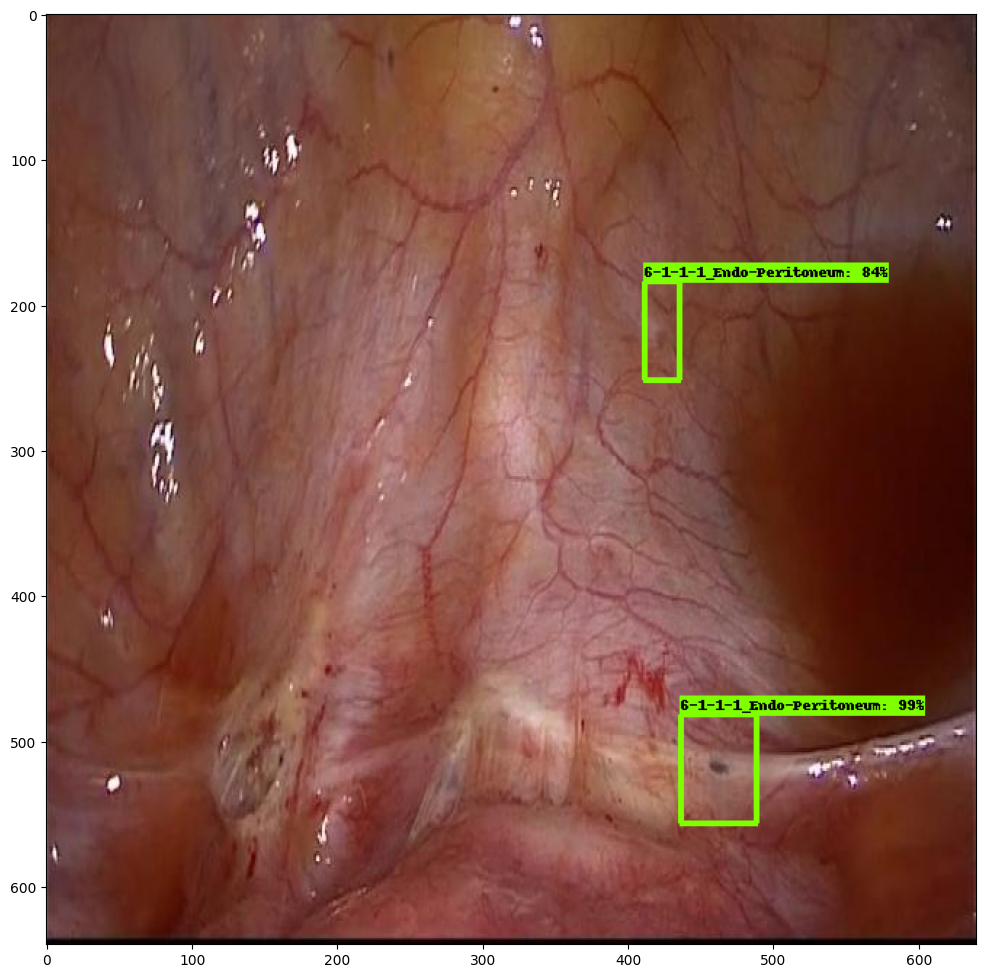

In [64]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

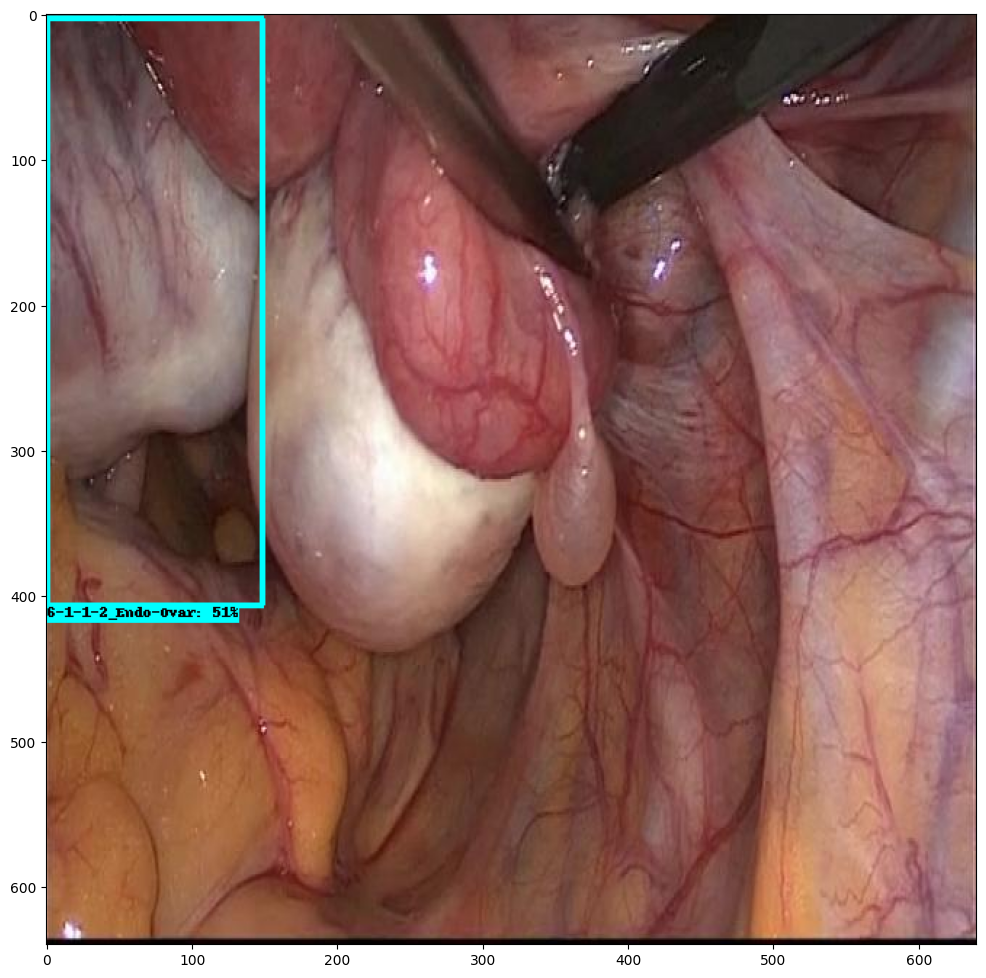

In [85]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

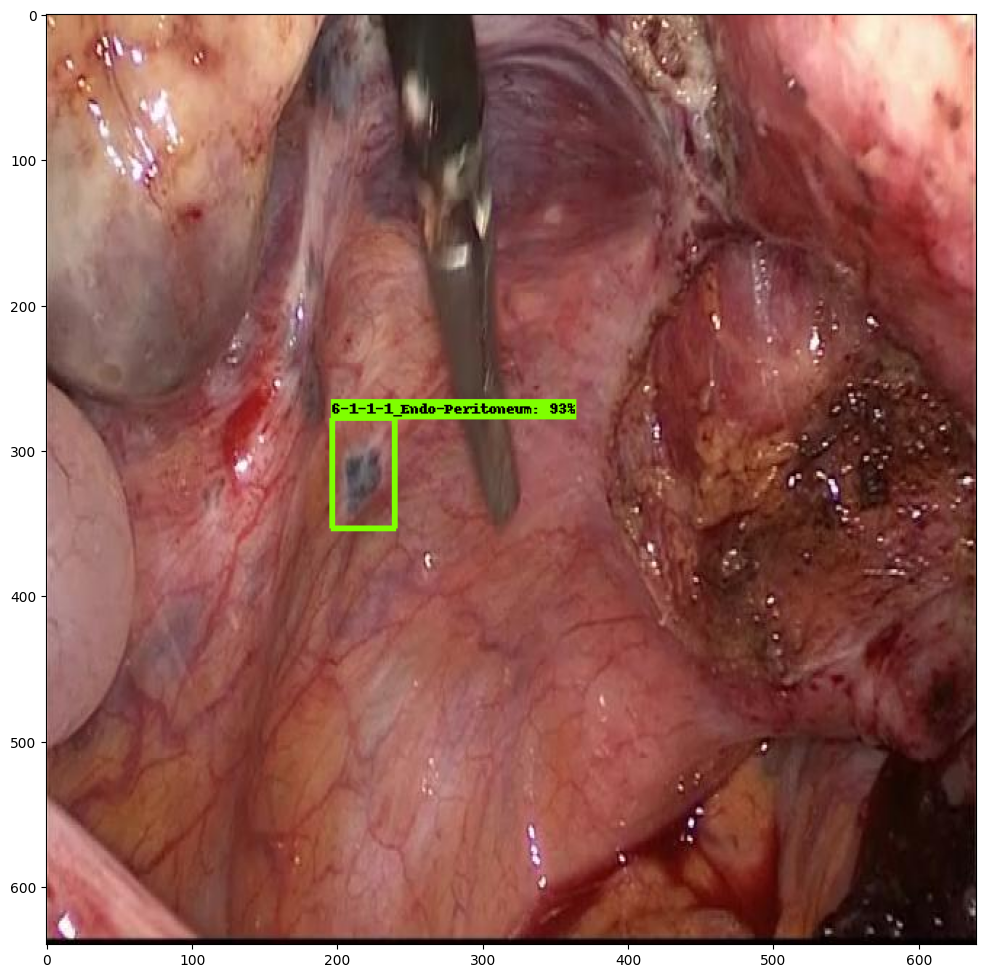

In [89]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
#import random

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

In [123]:
# Load image into a numpy array
image_np = load_image_into_numpy_array(image_path)

# Check if image_np is None
if image_np is not None:
    # Convert image to float32
    image_np_float32 = image_np.astype(np.float32)
    input_tensor = tf.convert_to_tensor(
        np.expand_dims(image_np_float32, 0), dtype=tf.float32)
    detections, _, _ = detect_fn(input_tensor)
else:
    print("Error: Unable to load image or image_np is None.")


Error: Unable to load image or image_np is None.


In [124]:
print("Image Path:", image_path)


Image Path: /home/759635/test/Endo-1/test/c_70_v_-video_2178-mp4-_f_769_jpg.rf.77fc6e857b6d5ec850c67f7641f07bc3.jpg


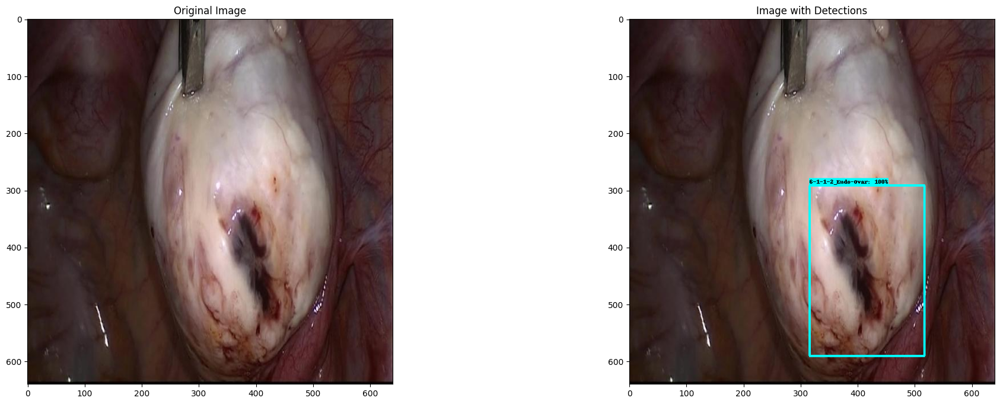

In [90]:

TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Convert image to a tensor
input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
    image_np_with_detections,
    detections['detection_boxes'][0].numpy(),
    (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
    detections['detection_scores'][0].numpy(),
    category_index,
    use_normalized_coordinates=True,
    max_boxes_to_draw=200,
    min_score_thresh=.5,
    agnostic_mode=False,
)

# Plot the original image and the one with detections side by side
fig, axes = plt.subplots(1, 2, figsize=(24, 8))

# Plot the original image
axes[0].imshow(image_np)
axes[0].set_title('Original Image')

# Plot the image with detections
axes[1].imshow(image_np_with_detections)
axes[1].set_title('Image with Detections')

plt.show()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


NameError: name 'x1' is not defined

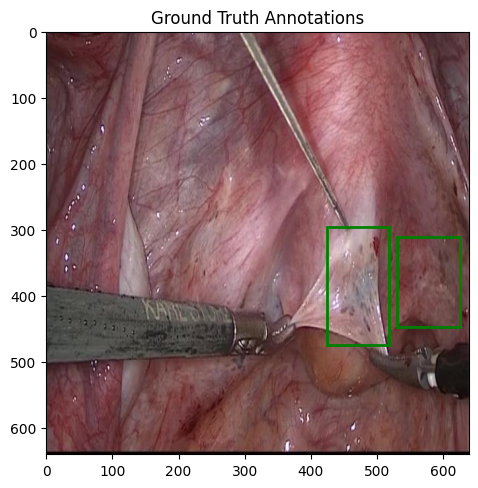

In [105]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import glob
import random
import numpy as np
from PIL import Image
import os

# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'

predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
for box in predicted_boxes:
    x, y, w, h = box
    rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
    plt.gca().add_patch(rect)

plt.show()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


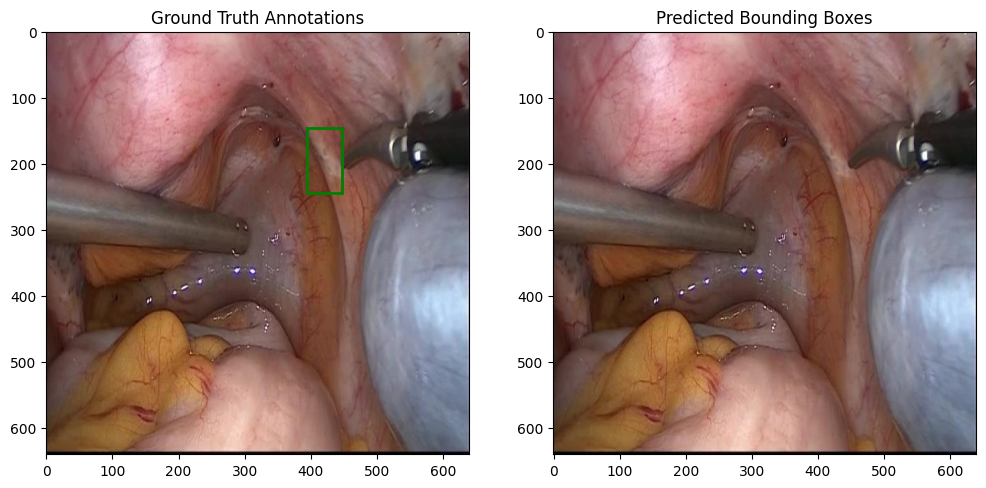

In [106]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from pycocotools.coco import COCO
import glob
import random
import numpy as np
from PIL import Image
import os

# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


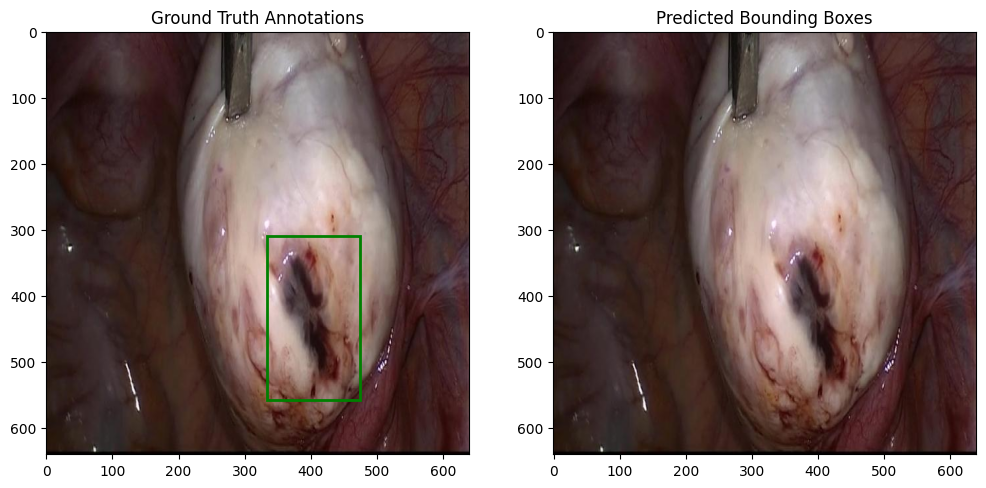

In [108]:
# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()


loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


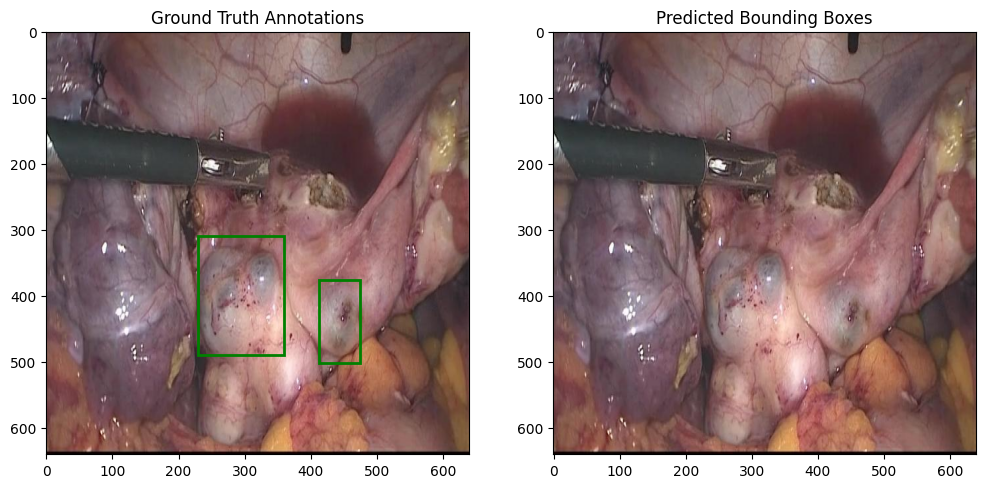

In [110]:
# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


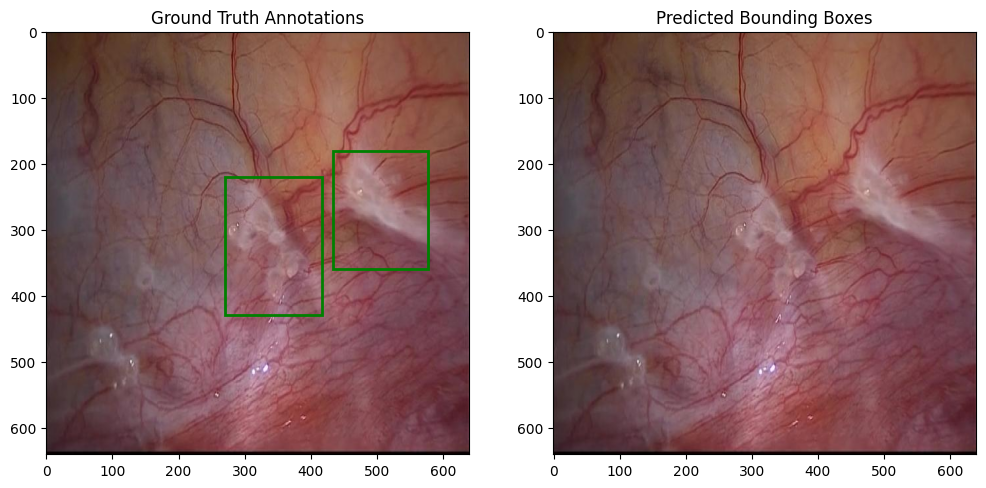

In [111]:
# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


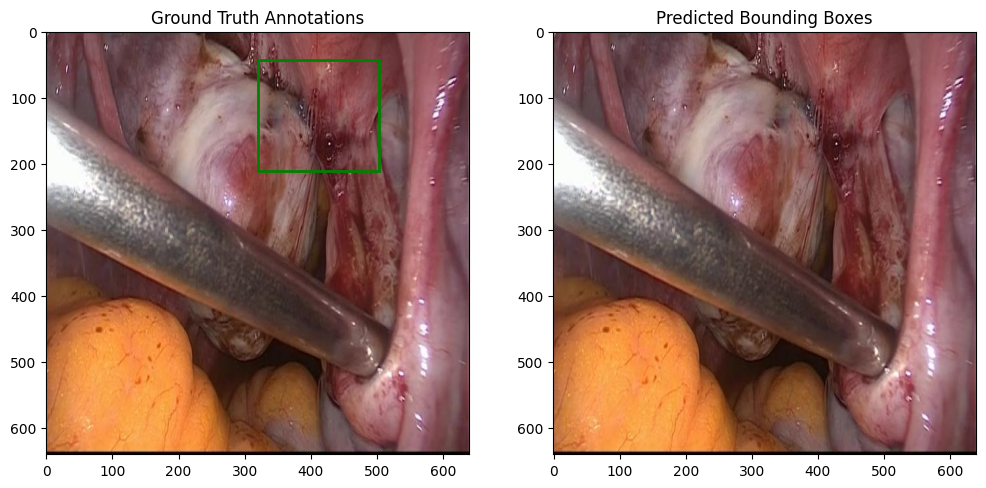

In [112]:
# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


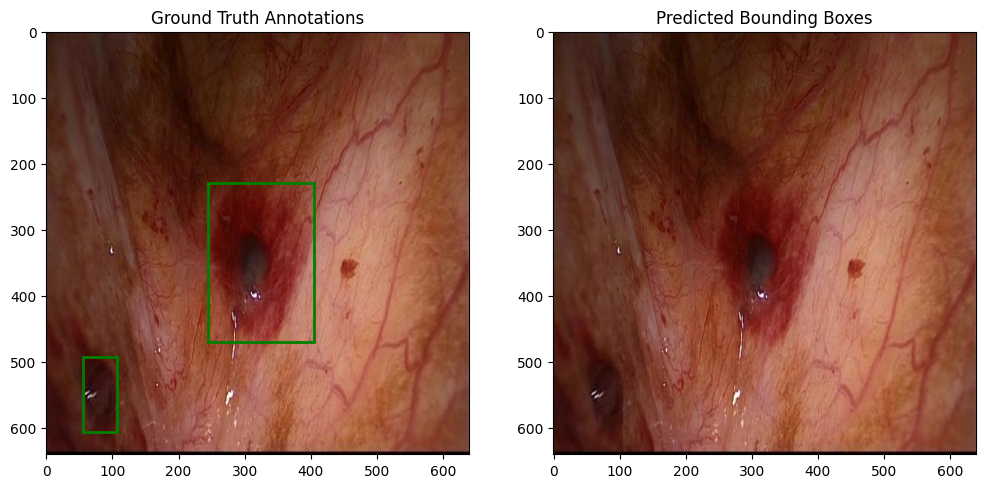

In [113]:
# Assume you have the following functions defined
def load_image_into_numpy_array(path):
    # Open image using PIL (Python Imaging Library)
    image = Image.open(path)

    # Convert image to NumPy array
    image_np = np.array(image)

    return image_np

# Load COCO annotations
coco_annotations_path = '/home/759635/test/Endo-1/test/_annotations.coco.json'  # replace with the actual path
coco = COCO(coco_annotations_path)

# Load a random image
TEST_IMAGE_PATHS = glob.glob('/home/759635/test/Endo-1/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Extract file name without extension
file_name = os.path.splitext(os.path.basename(image_path))[0]

# Find the image ID based on the file name
image_id = None
for img_id, img_info in coco.imgs.items():
    if file_name in img_info['file_name']:
        image_id = img_id
        break

if image_id is None:
    raise ValueError(f"Image ID not found for file: {file_name}")

# Load COCO annotations for the selected image
ann_ids = coco.getAnnIds(imgIds=image_id)
annotations = coco.loadAnns(ann_ids)

# Convert image to a format compatible with Matplotlib
image_pil = Image.fromarray(image_np)
image_np_with_annotations = np.array(image_pil)

# Display the original image with ground truth annotations
plt.figure(figsize=(12, 8))
plt.subplot(1, 2, 1)
plt.imshow(image_np_with_annotations)
plt.title('Ground Truth Annotations')

# Display ground truth annotations on the image
for ann in annotations:
    bbox = ann['bbox']
    rect = patches.Rectangle((bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor='g', facecolor='none')
    plt.gca().add_patch(rect)

# Comment out the placeholder for predicted_boxes
# Add code here to run your object detection model and get predictions
# You can replace this with your actual model prediction code
# For demonstration, let's assume the predicted bounding boxes are in the variable 'predicted_boxes'
# predicted_boxes = [(x1, y1, width, height), ...]

# Display the original image with predicted bounding boxes
plt.subplot(1, 2, 2)
plt.imshow(image_np_with_annotations)  # Use the same image with ground truth for consistency
plt.title('Predicted Bounding Boxes')

# Display predicted bounding boxes on the image
# Comment out the following line if predicted_boxes is not defined
# for box in predicted_boxes:
#     x, y, w, h = box
#     rect = patches.Rectangle((x, y), w, h, linewidth=2, edgecolor='r', facecolor='none')
#     plt.gca().add_patch(rect)

plt.show()